In [1]:
import cloudgenix
import pandas as pd
import csv
import traceback
import os
import json
import datetime
import sys
from IPython import display
import ipywidgets as widgets
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

%matplotlib inline


In [18]:
#
# Time frame for data query
#


def createdicts(SITE_NAMES):
    global customappsids
    global apps_id_name
    global apps_name_id
    global siteid_sitename_dict
    global sitename_siteid_dict
    global siteid_servicelinklist_dict
    global filtered_customappsids
    global SITELIST
    
    customappsids = []
    apps_id_name = {}
    apps_name_id = {}
    siteid_sitename_dict ={}
    sitename_siteid_dict={}
    siteid_servicelinklist_dict={}
    
    filtered_customappsids = []
    filtered_customapps = []


    #Get Appdefs
    resp = cgx_session.get.appdefs()
    if resp.cgx_content:
        applist = resp.cgx_content.get("items",None)

        for app in applist:
            apps_id_name[app['id']] = app['display_name']
            apps_name_id[app['display_name']] = app['id']

            # Custom Apps dict building
            if app['app_type'] == "custom":
                customappsids.append(app['id'])
                if app['display_name'] in filtered_customapps:
                    filtered_customappsids.append(app['id'])

    
    #Get Sites
    resp = cgx_session.get.sites()
    if resp.cgx_status:
        sitelist = resp.cgx_content.get("items", None)
        for site in sitelist:
            if site['name'] in SITE_NAMES:
                siteid_sitename_dict[site['id']] = site['name']
                sitename_siteid_dict[site['name']] = site['id']

    else:
        print("ERR: Could not retrieve sites")
        cloudgenix.jd_detailed(resp)

    #
    # Get all 3rd party tunnel IDs
    #

    siteid_servicelinklist_dict = {}
    for site in siteid_sitename_dict.keys():
        data = {
            "type": "basenet", 
            "nodes": [site]
        }

        pids = []
        resp = cgx_session.post.topology(data=data)
        if resp.cgx_status:
            topology = resp.cgx_content
            links = topology.get("links",None)
            for link in links:
                if link['type'] == "servicelink":
                    pids.append(link['path_id'])

            if len(pids)>0:
                siteid_servicelinklist_dict[site] = pids

        else:
            print("ERR: Could not retrieve topology for {}".format(SITE_NAME))
            cloudgenix.jd_detailed(resp)
            
    return


#
# Generate appidlist to be used by reports
#

def generate_appids(APP_NAMES):
    global APPIDLIST
    APPIDLIST=[]
    
    for app in APP_NAMES:
        if app in apps_name_id.keys():
            APPIDLIST.append(apps_name_id[app])
            
        else:
            print("{} not found".format(app))
        
    return


#
# Get App Health Data
#
def get_apphealth_data(START_TIME_ISO, END_TIME_ISO, INTERVAL):
    global apphealth
    apphealth = pd.DataFrame()
    
    for appid in APPIDLIST:
        print("\nRetrieving App Health Data for {}".format(apps_id_name[appid]))

        for site in sitename_siteid_dict.keys():
            print("\t{}".format(site))

            apphealth_payload = {
                "start_time":START_TIME_ISO,
                "end_time":END_TIME_ISO,
                "interval":INTERVAL,
                "metrics":[
                    {"name":"AppUnreachable","statistics":["max"],"unit":"count"}
                ],
                "view":{"individual":"path_type"},
                "filter":{
                    "app":[appid],
                    "site":[sitename_siteid_dict[site]],
                    "path_type":PATH_TYPE,
                }
            }

            resp = cgx_session.post.monitor_metrics(data=apphealth_payload)
            if resp.cgx_status:
                metrics = resp.cgx_content.get("metrics",None)
                for item in metrics:                        
                    series = item.get("series", None)
                    for seriesdata in series:
                        view = seriesdata.get("view",None)
                        if view == "summary":
                            #path = "summary"
                            continue
                        else:
                            path = view['path_type']

                        data = seriesdata.get("data",None)[0]
                        datapoints = data.get("datapoints",None)
                        dp = pd.DataFrame(datapoints)
                        dp = dp.rename(columns={"value":"val"})
                        dp['site'] = site
                        dp['path'] = path
                        dp['app'] = apps_id_name[appid]
                        apphealth = pd.concat([apphealth,dp],ignore_index=True)
                        

            else:
                print("ERR: Could not retrieve App Health for {}".format(apps_id_name[appid]))
                cloudgenix.jd_detailed(resp)
    
    return



def getweeklydistribution():
    global trendappresponsetime
    END_TIME = datetime.datetime.utcnow().replace(second=0, microsecond=0)
    START_TIME = END_TIME - datetime.timedelta(days=7)

    END_TIME_ISO = END_TIME.isoformat() + "Z"
    START_TIME_ISO = START_TIME.isoformat() + "Z"
    
    appresponsetime_xlate = {
    "AppRoundTripTime": "RTT",
    "AppServerResponseTime": "SRT"
    }
    
    trendappresponsetime = pd.DataFrame()
    
    for site in siteid_sitename_dict.keys():
        print("Site: {}".format(siteid_sitename_dict[site]))
        
        for appid in APPIDLIST:
            print("\t\t{}".format(apps_id_name[appid]))

            payload = {
                "start_time":START_TIME_ISO,
                "end_time":END_TIME_ISO,
                "interval":"1hour",
                "metrics":[
                    #{"name":"AppNormalizedNetworkTransferTime","statistics":["average"],"unit":"milliseconds"},
                    {"name":"AppRoundTripTime","statistics":["average"],"unit":"milliseconds"},
                    {"name":"AppServerResponseTime","statistics":["average"],"unit":"milliseconds"},
                    #{"name":"AppUDPTransactionResponseTime","statistics":["average"],"unit":"milliseconds"}
                ],
                "view":{"individual":"path_type"},
                "filter":{
                    "site":[site],
                    "app":[appid],
                    "path_type":PATH_TYPE
                }
            }
                        
            resp = cgx_session.post.monitor_metrics(data=payload)
            if resp.cgx_status:
                metrics = resp.cgx_content.get("metrics")
                for item in metrics:                        
                    series = item.get("series", None)
                    for seriesdata in series:
                        view = seriesdata.get("view",None)
                        if view == "summary":
                            continue
                            #path = "summary"
                        else:
                            path = view['path_type']
                            
                        data = seriesdata.get("data",None)[0]
                        datatype = appresponsetime_xlate[seriesdata['name']]
                        datapoints = data.get("datapoints",None)
                        dp = pd.DataFrame(datapoints)
                        dp = dp.rename(columns = {"value":"val"})
                        dp['site'] = siteid_sitename_dict[site]
                        dp['path'] = path
                        dp['app'] = apps_id_name[appid]
                        dp['dtype'] = datatype
                        trendappresponsetime = pd.concat([trendappresponsetime,dp],ignore_index=True)

            else:
                print("ERR: Could not query Application Response Time for {}".format(apps_id_name[appid]))
                cloudgenix.jd_detailed(resp)

    return



def getappdistribution(data):
    
    appdata = data.copy(deep=True)
    appdata = appdata.dropna()

    global appsitepath_rttdist_dict
    global appsitepath_srtdist_dict
    global appdist
    
    appsitepath_rttdist_dict = {}
    appsitepath_srtdist_dict = {}
    appdist = pd.DataFrame()
    
    if len(data)>0:
        for appid in APPIDLIST:
            appname = apps_id_name[appid]
            tmp = appdata[appdata.app == appname]
            
            for site in sitename_siteid_dict.keys():
                ds = tmp[tmp.site == site]
        
                for path in PATH_TYPE:
                    dp = ds[ds.path == path]
                
                    # RTT
                    df_rtt = dp[dp.dtype == "RTT"]
                    mean = df_rtt.val.mean()
                    std = df_rtt.val.std()
                    maxv = df_rtt.val.max()
                    valpct80 = df_rtt.val.quantile(.8)
                    appsitepath_rttdist_dict[(appname,site,path)] = {"meanval": mean, "stdval": std, "maxval":maxv,"valpct80":valpct80}
                    appdist = appdist.append({"app": appname, "site":site,"path":path, "dtype": "RTT", "meanval":mean, "stdval": std, "maxval":maxv, "valpct80":valpct80},ignore_index=True)

                    
                    # SRT
                    df_srt = dp[dp.dtype == "SRT"]
                    mean = df_srt.val.mean()
                    std = df_srt.val.std()
                    maxv = df_srt.val.max()
                    valpct80 = df_rtt.val.quantile(.8)
                    appsitepath_srtdist_dict[(appname,site,path)] = {"meanval": mean, "stdval": std, "maxval":maxv, "valpct80":valpct80}
                    appdist = appdist.append({"app": appname,"site":site,"path":path, "dtype": "SRT", "meanval":mean, "stdval": std, "maxval":maxv, "valpct80":valpct80},ignore_index=True)


    return



def get_app_problemsites(data, trenddata):
    getappdistribution(trenddata)
    
    data['dt'] = data.time.astype('datetime64[ns]')
    data['date'] = data.dt.dt.date
    data['hour'] = data.dt.dt.hour
    
    appdata = data.copy(deep=True)
    appdata = appdata.dropna()
    
    global appname_badrttsitelist_dict
    global appname_badsrtsitelist_dict
    global badappdist

    appname_badrttsitelist_dict = {}
    appname_badsrtsitelist_dict = {}
    badappdist = pd.DataFrame()

    for appid in APPIDLIST:
        appname = apps_id_name[appid]
        df = appdata[appdata.app == appname]
        
        sitelist_rtt = []
        sitelist_srt = []

        for site in sitename_siteid_dict.keys():
            
            tmp = df[df.site == site]
            
            for path in PATH_TYPE:
                dp = tmp[tmp.path == path]
                
                apprttdist = appsitepath_rttdist_dict[(appname,site,path)]
                appsrtdist = appsitepath_srtdist_dict[(appname,site,path)]
                rtt = dp[dp.dtype == "RTT"].val.quantile(.8)
                #rtt_thresh = apprttdist['meanval'] + apprttdist['stdval']
                rtt_thresh = apprttdist['valpct80']

                if rtt >= (rtt_thresh):
                    rtt_tmp = dp[(dp.val >= rtt_thresh)&(dp.dtype == "RTT")]

                    incidents = len(rtt_tmp)
                    hours = list(rtt_tmp.hour.unique())

                    badappdist = badappdist.append({"site":site, "app": appname,"path":path, "thresh":rtt_thresh, "valpct80":rtt, "metric": "RTT", "num_dp":len(dp[dp.dtype == "RTT"]),"num_incidents":incidents, "hours":hours}, ignore_index=True)
                    if site in sitelist_rtt:
                        continue
                    else:
                        sitelist_rtt.append(site)

                
                srt = dp[dp.dtype == "SRT"].val.quantile(.8)
                #srt_thresh = appsrtdist['meanval'] + appsrtdist['stdval']
                srt_thresh = appsrtdist['valpct80']

                if srt >= (srt_thresh):
                    
                    srt_tmp = dp[(dp.val >= srt_thresh)&(dp.dtype == "SRT")]

                    incidents = len(srt_tmp)
                    hours = list(srt_tmp.hour.unique())

                    badappdist = badappdist.append({"site":site, "app": appname,"path":path, "thresh":srt_thresh,"valpct80":srt, "metric": "SRT", "num_dp":len(dp[dp.dtype == "SRT"]),"num_incidents":incidents, "hours":hours}, ignore_index=True)
                    
                    if site in sitelist_srt:
                        continue
                    else:
                        sitelist_srt.append(site)

        appname_badrttsitelist_dict[appname] = sitelist_rtt
        appname_badsrtsitelist_dict[appname] = sitelist_srt
        
    return 

#
# Get Application RTT & SRT
#

def get_appresponse_data(START_TIME_ISO,END_TIME_ISO, INTERVAL):
    
    
    global appresponsetime
    global appresponsetime_xlate
    
    appresponsetime_xlate = {
    "AppRoundTripTime": "RTT",
    "AppServerResponseTime": "SRT"
    }
    
    appresponsetime = pd.DataFrame()

    print("\nRetrieving App Response Time Data for the following applications:".format())
    
    for site in siteid_sitename_dict.keys():
        print("Site: {}".format(siteid_sitename_dict[site]))
        
        for appid in APPIDLIST:
            print("\t\t{}".format(apps_id_name[appid]))

            payload = {
                "start_time":START_TIME_ISO,
                "end_time":END_TIME_ISO,
                "interval":INTERVAL,
                "metrics":[
                    #{"name":"AppNormalizedNetworkTransferTime","statistics":["average"],"unit":"milliseconds"},
                    {"name":"AppRoundTripTime","statistics":["average"],"unit":"milliseconds"},
                    {"name":"AppServerResponseTime","statistics":["average"],"unit":"milliseconds"},
                    #{"name":"AppUDPTransactionResponseTime","statistics":["average"],"unit":"milliseconds"}
                ],
                "view":{"individual":"path_type"},
                "filter":{
                    "site":[site],
                    "app":[appid],
                    "path_type":PATH_TYPE
                }
            }
                        
            resp = cgx_session.post.monitor_metrics(data=payload)
            if resp.cgx_status:
                metrics = resp.cgx_content.get("metrics")
                for item in metrics:                        
                    series = item.get("series", None)
                    for seriesdata in series:
                        view = seriesdata.get("view",None)
                        if view == "summary":
                            continue
                            #path = "summary"
                        else:
                            path = view['path_type']
                            
                        data = seriesdata.get("data",None)[0]
                        datatype = appresponsetime_xlate[seriesdata['name']]
                        datapoints = data.get("datapoints",None)
                        dp = pd.DataFrame(datapoints)
                        dp = dp.rename(columns = {"value":"val"})
                        dp['site'] = siteid_sitename_dict[site]
                        dp['path'] = path
                        dp['app'] = apps_id_name[appid]
                        dp['dtype'] = datatype
                        appresponsetime = pd.concat([appresponsetime,dp],ignore_index=True)

            else:
                print("ERR: Could not query Application Response Time for {}".format(apps_id_name[appid]))
                cloudgenix.jd_detailed(resp)

    return

#
# Plot Health Heatmap
#
def generate_heatmap_apphealth(apphealth, DIR_PATH):
    
    print("\n\nPlotting Heatmap for application health across WAN paths...\n\n")
    apphealth = apphealth.fillna(0)
    apphealth['t'] = apphealth['time'].str[:-8]

    for appid in APPIDLIST:
        appname = apps_id_name[appid]
        df = apphealth[apphealth.app == appname]
        
        paths = df.path.unique()
        for path in paths:
            if (path == "summary"):
                continue

            plotdata = df[df.path == path]
            valtype = list(plotdata.val.unique())
            if valtype == [0]:
                continue

            if (len(plotdata) > 0):
                plotdata = plotdata.pivot("t","site","val")
                plt.figure(figsize=(100,50))
                with sns.axes_style("white"):
                    cbar_kws = {'ticks' : [0,101,201,301]}
                    ax = sns.heatmap(plotdata, xticklabels=True, yticklabels=True,cmap=ListedColormap(['white','green', 'yellow', 'red']),cbar_kws=cbar_kws, vmin=0, vmax=301, cbar=False)

                    plottitle = "Application Health for {} on {}".format(appname,path)
                    ax.set_title(plottitle, fontweight='bold', fontsize='50')

                    ax.set_xlabel(xlabel='', fontsize='50', fontweight='bold')
                    ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', fontweight = 'bold', fontsize = 35,rotation=45)

                    ax.invert_yaxis()
                    ax.set_ylabel(ylabel='Time', fontsize=50, fontweight='bold')

                    for tick in ax.yaxis.get_major_ticks():
                        tick.label.set_fontsize(30)
                        tick.label.set_fontweight('bold')

                    ylabels = [item.get_text() for item in ax.get_yticklabels()]

                    newlabel = []
                    num = len(ylabels)
                    i = 0
                    for label in ylabels:
                        tmp = label.rsplit('T')
                        date = tmp[0]
                        year, month, day = (int(x) for x in date.split('-'))
                        day = datetime.date(year, month, day)

                        time = tmp[1]
                        hour, minute = (int(x) for x in time.split(':'))
                        if minute > 30:
                            hour = hour + 1

                        lbl = "{} {}:00".format(date,hour)
                        if lbl in newlabel:
                            newlabel.append(" ")
                        else:
                            newlabel.append(lbl)


                    ax.set_yticklabels(newlabel)

                    plt.yticks(rotation=0) 
            #         colorbar = ax.collections[0].colorbar
            #         colorbar.set_ticks([0,101, 201, 301])
            #         colorbar.set_ticklabels(['No Data', 'Good', 'Partially Good','Unreachable'],)
            #         colorbar.ax.tick_params(labelsize=20) 

                    figure = ax.get_figure()    
                    loc = '{}/apphealth/heatmap_{}_{}.png'.format(DIR_PATH,appname,path)
                    figure.savefig(loc, Transparent=True, bbox_inches="tight")
            
    return




#
# Plot Heatmap
#

def generate_heatmap_appresponse(appresponsetime, vmin=None, vmax=None):
    print("\n\nPlotting Heatmap for application response time across WAN paths...\n\n")
    appresponsetime = appresponsetime.fillna(0)
    appresponsetime['t'] = appresponsetime['time'].str[:-8]
    
    for appid in APPIDLIST:
        appname = apps_id_name[appid]
        ds = appresponsetime[appresponsetime.app == appname]
        paths = ds.path.unique()
    
        for path in paths:
            df = ds[ds.path == path]

            types = df.dtype.unique()
            for ttype in types:
                plotdata = df[df.dtype == ttype]
                values = list(plotdata.val.unique())
                if values == [0]:
                    continue
                    
                if len(plotdata) > 0:
                    plotdata = plotdata.pivot("t","site","val")
                    plt.figure(figsize=(100,50))
                    with sns.axes_style("white"):
                        ax = sns.heatmap(plotdata, xticklabels=True, yticklabels=True,cmap="YlGnBu",vmin=vmin, vmax=vmax)

                        plottitle = "{} for {} on {}".format(ttype,appname,path)
                        ax.set_title(plottitle, fontweight='bold', fontsize='50')

                        ax.set_xlabel(xlabel='', fontsize='50', fontweight='bold')
                        ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', fontweight = 'bold', fontsize = 35,rotation=45)

                        ax.invert_yaxis()
                        ax.set_ylabel(ylabel='Time', fontsize=50, fontweight='bold')

                        for tick in ax.yaxis.get_major_ticks():
                            tick.label.set_fontsize(30)
                            tick.label.set_fontweight('bold')

                        ylabels = [item.get_text() for item in ax.get_yticklabels()]

                        newlabel = []
                        num = len(ylabels)
                        i = 0
                        for label in ylabels:
                            tmp = label.rsplit('T')
                            date = tmp[0]
                            year, month, day = (int(x) for x in date.split('-'))
                            day = datetime.date(year, month, day)

                            time = tmp[1]
                            hour, minute = (int(x) for x in time.split(':'))
                            if minute > 30:
                                hour = hour + 1

                            lbl = "{} {}:00".format(date,hour)
                            if lbl in newlabel:
                                newlabel.append(" ")
                            else:
                                newlabel.append(lbl)


                        ax.set_yticklabels(newlabel)

                        plt.yticks(rotation=0)          
                        colorbar = ax.collections[0].colorbar
                #         colorbar.set_ticks([0,101, 201, 301])
                #         colorbar.set_ticklabels(['No Data', 'Good', 'Partially Good','Unreachable'],)
                        colorbar.ax.tick_params(labelsize=30) 

                        figure = ax.get_figure()    
                        loc = '{}/appresponse/heatmap_{}_{}_{}.png'.format(DIR_PATH,appname,path,ttype)
                        figure.savefig(loc, Transparent=True, bbox_inches="tight")

    return



#
# UNREACHABLE PREFIXES
#


def get_unreachableprefix_data():
    global appunreachable
    appunreachable = pd.DataFrame()

    print("\nRetrieving Unreachable Prefixes")

    for site in sitename_siteid_dict.keys():
        print("{}".format(site))
        
        for appid in APPIDLIST:
            print("\t{}".format(apps_id_name[appid]))
            
            for path in PATH_TYPE:
                
                data = {
                    "end_time":END_TIME_ISO,
                    "start_time":START_TIME_ISO,
                    "filter":{
                        "site":[sitename_siteid_dict[site]],
                        "app":[appid],
                        "path_type":[path],
                    },
                    "aggregates":[{"name":"PrefixList"}]
                }

                resp = cgx_session.post.monitor_aggregates(data=data)
                if resp.cgx_status:
                    aggregates = resp.cgx_content.get("aggregates", None)[0]
                    data = aggregates.get("data")
                    prefixlist = data.get("items",None)
                    for prefix in prefixlist:
                        appunreachable = appunreachable.append({"site": site,
                                                                "app":apps_id_name[appid],
                                                                "path":path,
                                                               "prefix":prefix['prefix'],
                                                               "app_unreachable_events":prefix['app_unreachable_events'],
                                                               "failed_connection_events":prefix['failed_connection_events'],
                                                               "failed_transaction_events":prefix['failed_transaction_events']}, ignore_index=True)

        #             ds = appunreachable[appunreachable.app == apps_id_name[appid]]
        #             if len(ds) > 0:
        #                 display.display(ds)

                else:
                    print("ERR: Could not query unreachable prefixes for {}".format(apps_id_name[appid]))

    return


#
# App Transaction Metrics
#

def get_apptransaction_data(START_TIME_ISO,END_TIME_ISO, INTERVAL):
    
    global apptransaction_xlate
    global apptransaction
    
    apptransaction_xlate = {
    "AppSuccessfulConnections":"INIT_SUCCESS",
    "AppSuccessfulTransactions":"TXN_SUCCESS",
    "AppFailedToEstablish":"INIT_FAIL",
    "AppTransactionFailures":"TXN_FAIL"
    }
    apptransaction = pd.DataFrame(columns=["app","path","dtype","time","val"])

    print("\nRetrieving App Transaction Stats:")
    
    for appid in APPIDLIST:
        appname = apps_id_name[appid]
        print("{}".format(appname))
        
        for site in sitename_siteid_dict.keys():
            print("\t{}".format(site))

            data = {
                "start_time":START_TIME_ISO,
                "end_time":END_TIME_ISO,
                "interval":INTERVAL,
                "metrics":[
                    {"name":"AppSuccessfulConnections","statistics":["sum"],"unit":"count"},
                    {"name":"AppSuccessfulTransactions","statistics":["sum"],"unit":"count"},
                    {"name":"AppFailedToEstablish","statistics":["sum"],"unit":"count"},
                    {"name":"AppTransactionFailures","statistics":["sum"],"unit":"count"}
                ],
                "view":{"individual":"path_type"},
                "filter":{
                    "site":[sitename_siteid_dict[site]],
                    "app":[appid],
                    "path_type":PATH_TYPE
                }
            }

            resp = cgx_session.post.monitor_metrics(data=data)
            if resp.cgx_status:
                metrics = resp.cgx_content.get("metrics")
                for item in metrics:                        
                    series = item.get("series", None)
                    for seriesdata in series:
                        view = seriesdata.get("view",None)
                        if view == "summary":
                            continue
                            #path = "summary"
                        else:
                            path = view['path_type']
                            
                        data = seriesdata.get("data",None)[0]
                        datatype = apptransaction_xlate[seriesdata['name']]
                        datapoints = data.get("datapoints",None)

                        dp = pd.DataFrame(datapoints)
                        dp = dp.rename(columns = {"value":"val"})
                        dp['site'] = site
                        dp['path'] = path
                        dp['app'] = appname
                        dp['dtype'] = datatype
                        apptransaction = pd.concat([apptransaction,dp],ignore_index=True)

            else:
                print("ERR: Could not query Application Transaction Stats for {} on site {} and path {}".format(appname,site,path))
                cloudgenix.jd_detailed(resp)

    return



#
# App Transaction Metrics
#

def get_apptransaction_data_bad(badappdata,INTERVAL, APPNAMELIST=None,SITELIST=None):

    global badapptransaction
    badapptransaction = pd.DataFrame(columns=["app","path","dtype","time","val"])

    print("\nRetrieving App Transaction Stats:")

    xapplist = list(badappdata.app.unique())
    
    for appname in xapplist:
        print("{}".format(appname))
        tmp = badappdata[badappdata.app == appname]
        xsitelist = list(tmp.site.unique())
        
        for site in xsitelist:
            df = tmp[tmp.site == site]
            xpathlist = list(df.path.unique())
            
            for path in xpathlist:
                print("\t{}:{}".format(site,path))

                data = {
                    "start_time":START_TIME_ISO,
                    "end_time":END_TIME_ISO,
                    "interval":INTERVAL,
                    "metrics":[
                        {"name":"AppSuccessfulConnections","statistics":["sum"],"unit":"count"},
                        {"name":"AppSuccessfulTransactions","statistics":["sum"],"unit":"count"},
                        {"name":"AppFailedToEstablish","statistics":["sum"],"unit":"count"},
                        {"name":"AppTransactionFailures","statistics":["sum"],"unit":"count"}
                    ],
                    "view":{},
                    "filter":{
                        "site":[sitename_siteid_dict[site]],
                        "app":[apps_name_id[appname]],
                        "path_type":[path]
                    }
                }

                resp = cgx_session.post.monitor_metrics(data=data)
                if resp.cgx_status:
                    metrics = resp.cgx_content.get("metrics")
                    for item in metrics:                        
                        series = item.get("series", None)
                        for seriesdata in series:
                            data = seriesdata.get("data",None)[0]
                            datatype = apptransaction_xlate[seriesdata['name']]
                            datapoints = data.get("datapoints",None)

                            dp = pd.DataFrame(datapoints)
                            dp = dp.rename(columns = {"value":"val"})
                            dp['site'] = site
                            dp['path'] = path
                            dp['app'] = appname
                            dp['dtype'] = datatype
                            badapptransaction = pd.concat([badapptransaction,dp],ignore_index=True)

                else:
                    print("ERR: Could not query Application Transaction Stats for {} on site {} and path {}".format(appname,site,path))
                    cloudgenix.jd_detailed(resp)

    return



#
# List data in a tabular format
#
def generate_table(datadict, application=None, tabletype="table", dropNAN=False):
    data = datadict.copy(deep = True)
    tabledata = pd.DataFrame()
    if dropNAN:
        data = data.dropna()
        
    if tabletype in ["table", "percentile", "count"]:
        
        if tabletype == "table":
            if application:
                tabledata = data[data.app == application]
                if len(tabledata) > 0:
                    display.display(tabledata)

            else:
                display.display(data)
                tabledata = data

        elif tabletype == "percentile":
            if application:
                df = data[data.app == application]
                tabledata = pd.DataFrame(columns=["app","dtype","count","min","50","75","90","max"])
                types = list(df.dtype.unique())
                for t in types:
                    tmp = df[df.dtype == t]
                    tmp = tmp.dropna()
                    valdict = {}
                    valdict["app"] = application
                    valdict["dtype"] = t
                    valdict["count"] = tmp.val.count()
                    valdict["min"] = tmp.val.count()
                    valdict["50"] = tmp.val.quantile(.5)
                    valdict["75"] = tmp.val.quantile(.75)
                    valdict["90"] = tmp.val.quantile(.9)
                    valdict["max"] = tmp.val.max()
                    
                    tabledata = tabledata.append(valdict,ignore_index=True)
                
                display.display(tabledata)
                
            else:
                tabledata = pd.DataFrame(columns=["app","dtype","count","min","50","75","90","max"])

                for appid in APPIDLIST:
                    application = apps_id_name[appid]
                    df = data[data.app == application]
                    if len(df) > 0:
                        types = list(df.dtype.unique())
                        for t in types:
                            tmp = df[df.dtype == t]
                            tmp = tmp.dropna()
                            valdict = {}
                            valdict["app"] = application
                            valdict["dtype"] = t
                            valdict["count"] = tmp.val.count()
                            valdict["min"] = tmp.val.count()
                            valdict["50"] = tmp.val.quantile(.5)
                            valdict["75"] = tmp.val.quantile(.75)
                            valdict["90"] = tmp.val.quantile(.9)
                            valdict["max"] = tmp.val.max()

                            tabledata = tabledata.append(valdict,ignore_index=True)
                display.display(tabledata)
                
            
        else:
            if application:
                df = data[data.app == application]
                df = df.fillna(0)
                
                types = list(df.dtype.unique())
                columns = ["app"] + types

                tabledata = pd.DataFrame(columns=columns)
                valdict = {}
                valdict["app"] = application
                for t in types:
                    count = df[df.dtype == t].val.sum()
                    valdict[t] = count
                    
                tabledata = tabledata.append(valdict,ignore_index=True)
                display.display(tabledata)

                    
            else:
                types = list(data.dtype.unique())
                columns = ["app"] + types
                
                tabledata = pd.DataFrame(columns=columns)
                for appid in APPIDLIST:
                    application = apps_id_name[appid]
                    df = data[data.app == application]
                    df = df.fillna(0)

                    valdict = {}
                    valdict["app"] = application
                    for t in types:
                        count = df[df.dtype == t].val.sum()
                        valdict[t] = count
                    
                    tabledata = tabledata.append(valdict,ignore_index=True)
            
                display.display(tabledata)

        
    else:
        print("ERR: Invalid tabletype. Please choose from: table, percentile, count")
        
    #return tabledata
    return


# 
# Box Plot for Application Transaction Stats
#

def generate_boxplot_apptransaction(apptransaction, ymax="max",pval=None):
    %matplotlib inline
    cgnxpalette = ["#F37020", "#79797D", "#F6921E", "#FFC700", "#79BBE3", "#275682", "#E34126", "#D62800"]
    sns.set(style="white", rc={"lines.linewidth": 2})

    apptransactiondata = apptransaction.copy(deep=True)
    apptransactiondata = apptransactiondata.dropna()
    
    
    sites = apptransactiondata.site.unique()
    
    for site in sites:
        tmp = apptransactiondata[apptransactiondata.site == site]
        paths = tmp.path.unique()
        
        for path in paths:
            df = tmp[tmp.path == path]

            types = df.dtype.unique()
            for ttype in types:
                plotdata = df[df.dtype == ttype]
                if len(plotdata) > 0:
                    plotdata = plotdata.fillna(0)
                    valtype = list(plotdata.val.unique())
                    if valtype == [0]:
                        continue

                    fig, ax = plt.subplots(figsize=(20,15))
                    if ymax == "max":
                        maxval = plotdata.val.max()
                    elif ymax == "percentile":
                        if pval:
                            maxval = plotdata.val.quantile(pval/100)
                        else:
                            print("ERR: Please provide pval with percentile")
                    else:
                        maxval = ymax


                    plt.ylim(0,maxval)
                    ax = sns.boxplot(x="app", y="val", data=plotdata, palette = ["#F37020"])

                    title = "{}\n{} on {}".format(site,ttype,path)
                    ax.set_title(title, fontweight = 'bold', fontsize=35)
                    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha = 'right', fontweight = 'bold', fontsize = 15)
                    ax.set(ylabel="Count")
                    ax.set(xlabel="Applications")

                    #handles, dummy = ax.get_legend_handles_labels()
                    #ax.legend(handles, ['BUSINESS HOURS','OFF HOURS'])
                    figure = ax.get_figure()    
                    loc = "{}/apptransaction_boxplot_{}_{}_{}.png".format(DIR_PATH,site,path,ttype)
                    figure.savefig(loc, Transparent=True, bbox_inches="tight")
                    plt.show()
                    plt.cla()
                    plt.close()


    return



#
# Get Bad Apps based on Transaction
#

def getbadapps_xsact(apptransaction,valfilter ="ALL",threshold=5):
    
    apptransactiondata = apptransaction.copy(deep=True)
    global badapps_xsact
    badapps_xsact = pd.DataFrame()
    
    for appid in APPIDLIST:
        appname = apps_id_name[appid]
        tmp = apptransactiondata[apptransactiondata.app == appname]
        
#         sitelist_initfail = []
#         sitelist_txnfail = []
        
        for site in sitename_siteid_dict.keys():
            df = tmp[tmp.site == site]
            
            initf = df[df.dtype == "INIT_FAIL"].val.sum()
            txnf = df[df.dtype == "TXN_FAIL"].val.sum()

            totalinit = initf + df[df.dtype == "INIT_SUCCESS"].val.sum()
            if totalinit == 0:
                pctfail_init = 0
                pctfail_txn = 0
            else:
                pctfail_init = (initf*100)/totalinit
                pctfail_txn = (txnf*100)/totalinit
            
            if valfilter == "ALL":
                XVAL_INIT = initf
                XTHRESH_INIT = 0
                XVAL_TXN = txnf
                XTHRESH_TXN = 0
            elif valfilter == "LIMIT":
                XVAL_INIT = pctfail_init
                XTHRESH_INIT = threshold
                XVAL_TXN = pctfail_txn
                XTHRESH_TXN = threshold
            else:
                print("ERR: Invalid valfilter! Please select ALL or LIMIT")
                return
            
            if XVAL_INIT > XTHRESH_INIT:
                badapps_xsact = badapps_xsact.append({"app":appname,"site":site,"dtype":"INIT_FAIL","val":initf, "total_events":totalinit,"pct_fail":pctfail_init},ignore_index=True)
                
            
            if XVAL_TXN > XTHRESH_TXN:
                badapps_xsact = badapps_xsact.append({"app":appname,"site":site,"dtype":"TXN_FAIL","val":txnf,"total_events":totalinit,"pct_fail":pctfail_txn},ignore_index=True)

    return

#
# Create directories
#

def createdirs(DIR_PATH):
    
    dirs = ["appresponse", "apptransaction", "apphealth"]
    for folder in dirs:
        try:
            os.mkdir(DIR_PATH+"/"+folder)
        except Exception as err:
            error_str = "%s - %s" % (err, traceback.format_exc().replace("\n", "::"))
            print("ERR: Could not create directory: {}".format(folder))
        else:
            print("SUCCESS: Directory created: {}".format(folder))
    
    return
    

In [39]:
# Get Site List

resp = cgx_session.get.sites()
sitelist = resp.cgx_content.get("items", None)
for site in sitelist:
    print("\"{}\",".format(site["name"]))

"AWS US-West-1 (CloudWAN Demo)",
"AWS US-West-2",
"Branch 1",
"Branch 2",
"Branch 3",
"CGX AllStars DC1",
"CGX AllStars DC2",
"GCP US-East-1",


In [11]:
#
# Paste Auth Token
#

AUTH_TOKEN="paste token"

#
# Choose upto 10 applications to run the report for
#
APP_NAMES = ["rtp","ssl","Yahoo!","WebPoS","Office365 Portal","Marketo","WebEx","Salesforce"]


#
# Choose upto 10 Sites to run the report for
#
#SITE_NAMES = ["sitename1", "sitename2", "sitename3"]
SITE_NAMES=["Branch 1","Branch 2","Branch 3"]
#
# Report duration.
# Data will be collected for the time range between NOW and delta hours.
# For a more specific time range, feel free to set 
# START_TIME_ISO and END_TIME_ISO in the ISO format: "2020-08-10T00:00:00Z"
# Note: Max allowed values are upto a week.
#
HOURS = 24

#
# PATH Types
#
PATH_TYPE = ["DirectInternet", "VPN", "PrivateVPN", "PrivateWAN", "ServiceLink"]

#
# PATH to store images
#
DIR_PATH = "/Users/tkamath/Desktop/apptroubleshooting/tenant"


#
# Login & get App Health
#
cgx_session = cloudgenix.API()
cgx_session.interactive.use_token(AUTH_TOKEN)

#
# Check number of APPs
#
if len(APP_NAMES) > 10:
    print("ERR: Please pick upto 10 Applications")
    
if len(SITE_NAMES) > 10:
    print("ERR: Please pick upto 10 Sites")

In [12]:
#
# Calculate Start and End time for data
#
END_TIME = datetime.datetime.utcnow().replace(second=0, microsecond=0)
if HOURS > 168:
    print("WARN: Notebook only supports a max time period of a week. Resetting number of hours to 168 (24 * 7)")
    HOURS = 168

START_TIME = END_TIME - datetime.timedelta(hours=HOURS)

END_TIME_ISO = END_TIME.isoformat() + "Z"
START_TIME_ISO = START_TIME.isoformat() + "Z"


#
# Set SDK query interval
#
if HOURS > 24:
    INTERVAL = "1hour"
else:
    INTERVAL = "5min"

    
#####

print("Start time: {}".format(datetime.datetime.utcnow()))
createdirs(DIR_PATH=DIR_PATH)
createdicts(SITE_NAMES)
generate_appids(APP_NAMES)
get_apphealth_data(START_TIME_ISO, END_TIME_ISO,INTERVAL)
get_appresponse_data(START_TIME_ISO,END_TIME_ISO,INTERVAL)
get_unreachableprefix_data()
get_apptransaction_data(START_TIME_ISO, END_TIME_ISO,INTERVAL)
getweeklydistribution()
get_app_problemsites(data = appresponsetime, trenddata=trendappresponsetime)
print("End time: {}".format(datetime.datetime.utcnow()))


Start time: 2021-12-20 15:21:45.089522

Retrieving App Health Data for rtp
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for ssl
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for Yahoo!
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for WebPoS
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for Office365 Portal
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for Marketo
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for WebEx
	Branch 1
	Branch 2
	Branch 3

Retrieving App Health Data for Salesforce
	Branch 1
	Branch 2
	Branch 3

Retrieving App Response Time Data for the following applications:
Site: Branch 1
		rtp
		ssl
		Yahoo!
		WebPoS
		Office365 Portal
		Marketo
		WebEx
		Salesforce
Site: Branch 2
		rtp
		ssl
		Yahoo!
		WebPoS
		Office365 Portal
		Marketo
		WebEx
		Salesforce
Site: Branch 3
		rtp
		ssl
		Yahoo!
		WebPoS
		Office365 Portal
		Marketo
		WebEx
		Salesforce

Retrieving Unreachable Prefixes
Branch 1
	rtp
	s



Plotting Heatmap for application health across WAN paths...




<ipython-input-18-74c0431ebd44>:505: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "Transparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  figure.savefig(loc, Transparent=True, bbox_inches="tight")


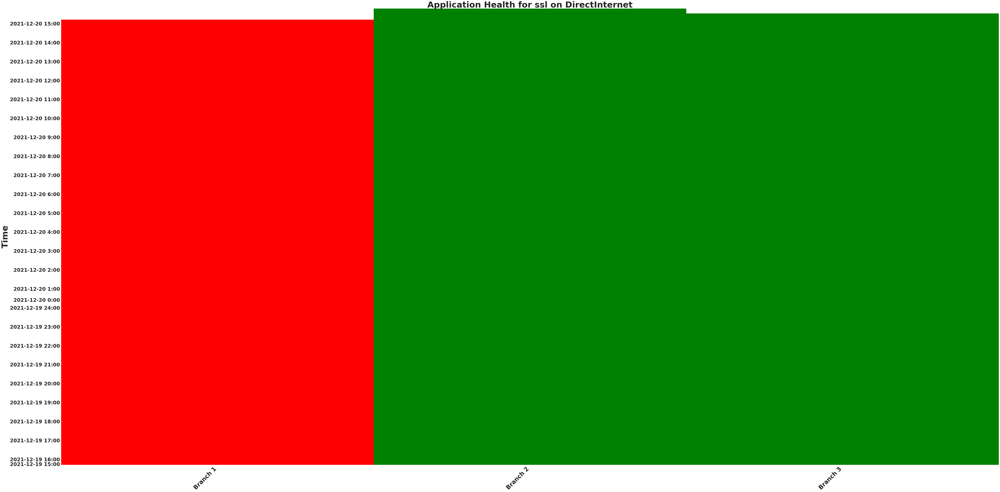

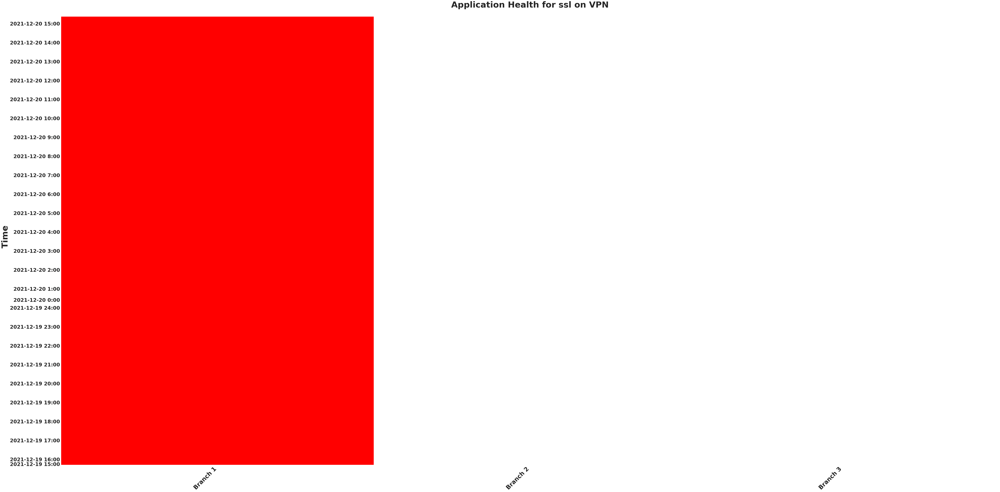

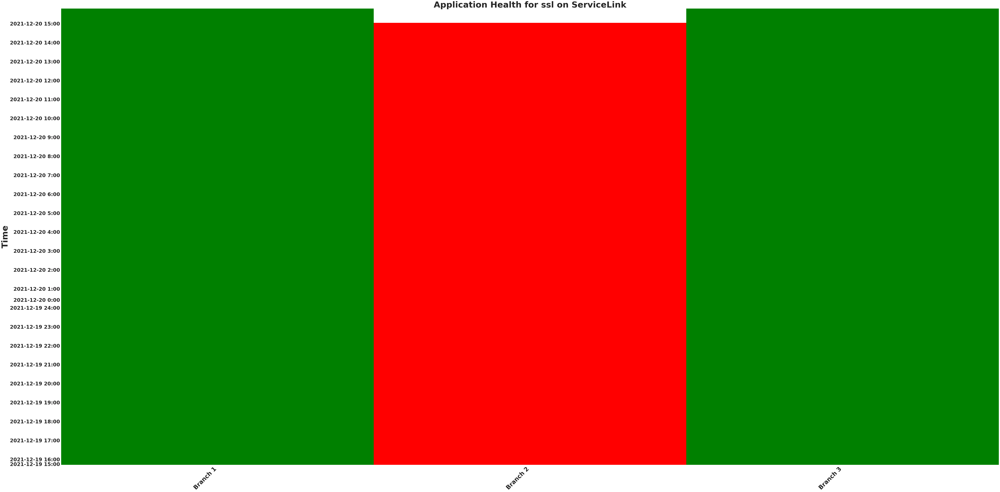

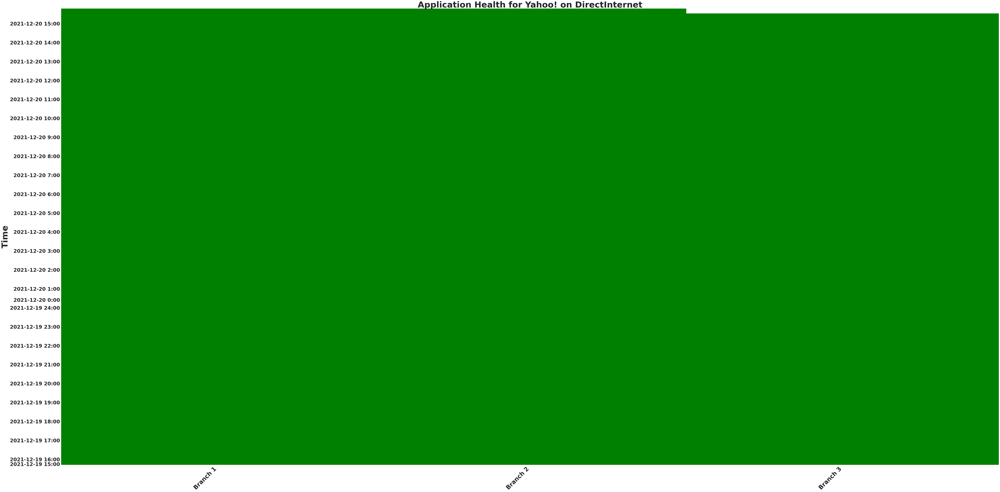

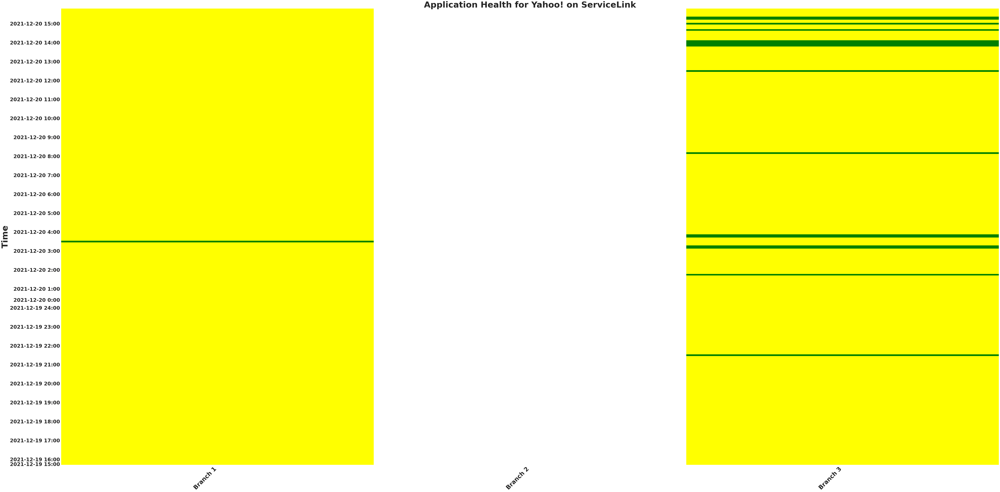

...

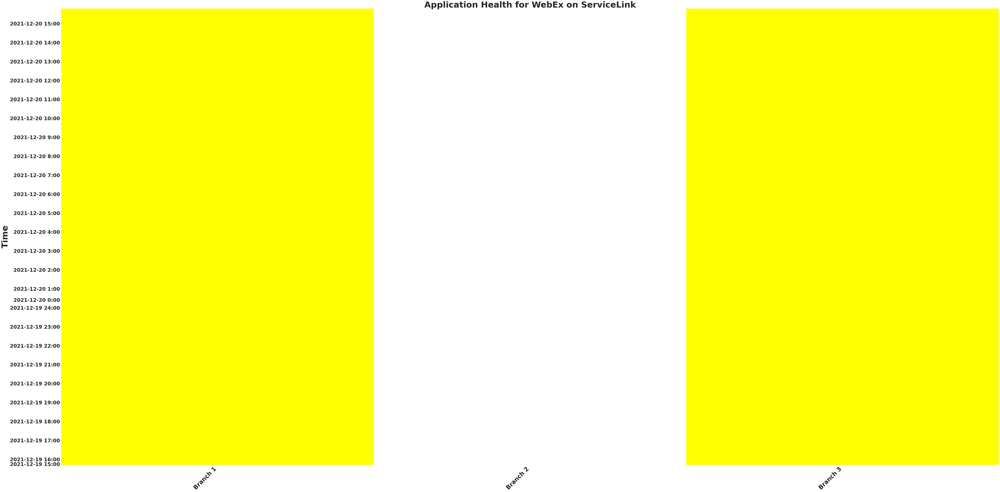

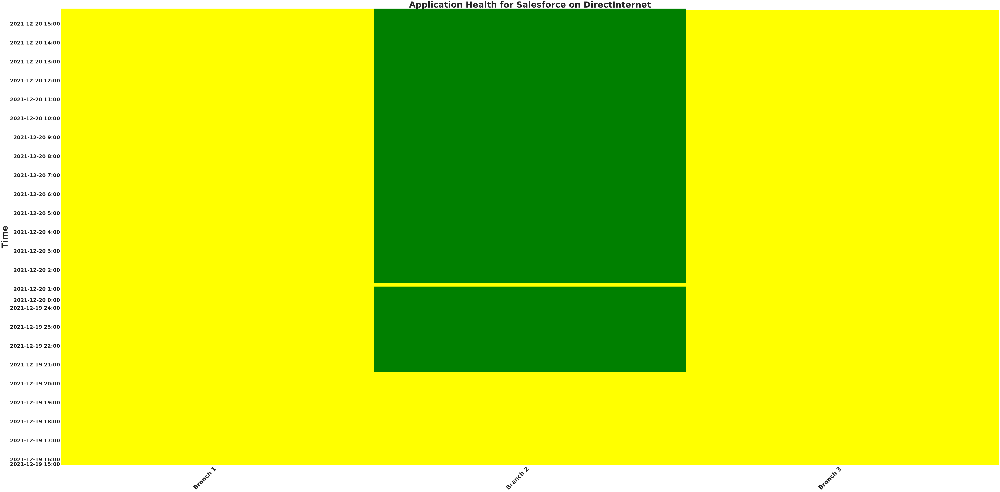

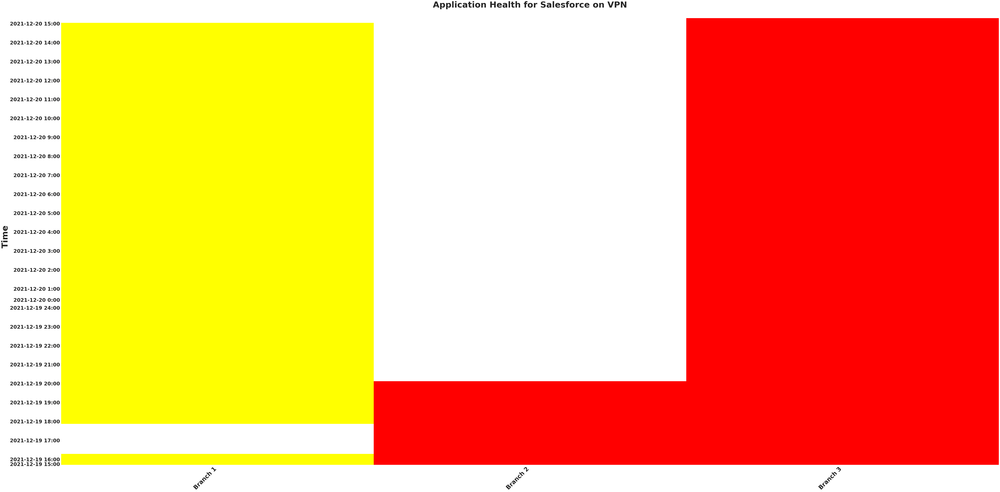

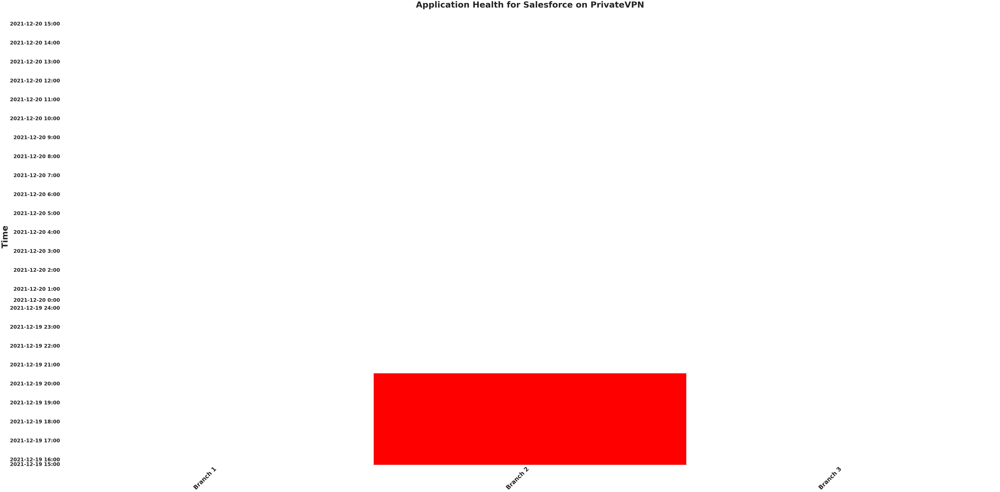

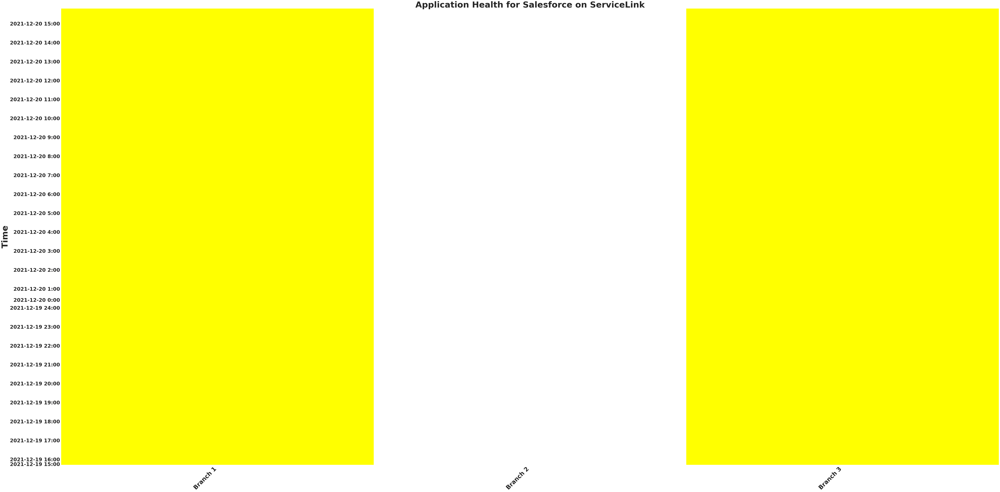

In [20]:
generate_heatmap_apphealth(apphealth=apphealth, DIR_PATH=DIR_PATH)

In [23]:
# 
# Sort by app, prefix and emphasis on count
# hide app_unreachable 
#

#generate_table(appunreachable,application="Office365 Portal")
for appid in APPIDLIST:
    appname = apps_id_name[appid]
    generate_table(appunreachable,application=appname)

,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
0,ssl,28.0,0.0,0.0,DirectInternet,0.0.0.0/0,Branch 1
1,ssl,26.0,0.0,0.0,VPN,0.0.0.0/0,Branch 1
2,ssl,58.0,7993.0,4355.0,ServiceLink,0.0.0.0/0,Branch 1
183,ssl,166.0,461.0,799.0,DirectInternet,0.0.0.0/0,Branch 2
184,ssl,28.0,0.0,0.0,ServiceLink,0.0.0.0/0,Branch 2
246,ssl,28.0,0.0,0.0,DirectInternet,0.0.0.0/0,Branch 3
247,ssl,214.0,4801.0,2773.0,ServiceLink,0.0.0.0/0,Branch 3


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
3,Yahoo!,639.0,0.0,0.0,ServiceLink,119.161.14.0/27,Branch 1
4,Yahoo!,506.0,0.0,10.0,ServiceLink,212.82.100.150/32,Branch 1
5,Yahoo!,30.0,0.0,209.0,ServiceLink,69.147.88.0/27,Branch 1
6,Yahoo!,111.0,0.0,239.0,ServiceLink,74.6.231.0/27,Branch 1
7,Yahoo!,100.0,0.0,203.0,ServiceLink,98.137.11.160/27,Branch 1
8,Yahoo!,524.0,0.0,45.0,ServiceLink,74.6.136.150/32,Branch 1
9,Yahoo!,5.0,0.0,174.0,ServiceLink,98.136.103.23/32,Branch 1
10,Yahoo!,3.0,0.0,15.0,ServiceLink,74.6.143.0/27,Branch 1
11,Yahoo!,3.0,0.0,0.0,ServiceLink,74.6.160.138/32,Branch 1
12,Yahoo!,0.0,0.0,18.0,ServiceLink,98.137.11.157/32,Branch 1


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
16,WebPoS,86.0,3.0,16.0,VPN,192.168.104.100/32,Branch 1
17,WebPoS,29.0,0.0,0.0,ServiceLink,192.168.104.100/32,Branch 1
193,WebPoS,48.0,5.0,10.0,VPN,192.168.104.100/32,Branch 2
259,WebPoS,94.0,2.0,1.0,VPN,192.168.104.100/32,Branch 3


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
18,Office365 Portal,1418.0,0.0,0.0,ServiceLink,184.50.1.123/32,Branch 1
19,Office365 Portal,1257.0,0.0,0.0,ServiceLink,23.222.197.248/32,Branch 1
20,Office365 Portal,1394.0,0.0,0.0,ServiceLink,104.70.202.59/32,Branch 1
21,Office365 Portal,1373.0,0.0,0.0,ServiceLink,2.18.68.88/32,Branch 1
22,Office365 Portal,1364.0,0.0,0.0,ServiceLink,23.55.248.64/32,Branch 1
...,...,...,...,...,...,...,...
299,Office365 Portal,0.0,0.0,2.0,ServiceLink,2.18.194.218/32,Branch 3
300,Office365 Portal,1296.0,0.0,0.0,ServiceLink,23.35.204.136/32,Branch 3
301,Office365 Portal,0.0,0.0,2.0,ServiceLink,184.30.231.17/32,Branch 3
302,Office365 Portal,0.0,0.0,1.0,ServiceLink,104.81.211.13/32,Branch 3


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
60,Marketo,866.0,0.0,0.0,ServiceLink,104.100.59.45/32,Branch 1
61,Marketo,1334.0,1.0,44.0,ServiceLink,104.16.95.80/32,Branch 1
62,Marketo,1295.0,0.0,62.0,ServiceLink,104.16.92.80/32,Branch 1
63,Marketo,964.0,0.0,0.0,ServiceLink,192.28.144.124/32,Branch 1
64,Marketo,308.0,0.0,1065.0,ServiceLink,104.18.191.233/32,Branch 1
65,Marketo,237.0,0.0,1658.0,ServiceLink,104.18.192.233/32,Branch 1
66,Marketo,1319.0,0.0,50.0,ServiceLink,104.16.93.80/32,Branch 1
67,Marketo,1.0,0.0,70.0,ServiceLink,104.16.94.80/32,Branch 1
68,Marketo,0.0,0.0,2.0,ServiceLink,104.17.74.206/32,Branch 1
69,Marketo,3.0,0.0,0.0,ServiceLink,199.232.196.134/32,Branch 1


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
82,WebEx,1173.0,0.0,0.0,ServiceLink,69.192.212.159/32,Branch 1
83,WebEx,975.0,0.0,0.0,ServiceLink,23.203.234.41/32,Branch 1
84,WebEx,494.0,0.0,0.0,ServiceLink,23.56.112.145/32,Branch 1
85,WebEx,494.0,0.0,0.0,ServiceLink,104.76.163.133/32,Branch 1
86,WebEx,1239.0,0.0,0.0,ServiceLink,92.123.80.16/32,Branch 1
...,...,...,...,...,...,...,...
354,WebEx,2080.0,0.0,0.0,ServiceLink,104.84.236.122/32,Branch 3
355,WebEx,1014.0,0.0,0.0,ServiceLink,72.246.165.247/32,Branch 3
356,WebEx,779.0,0.0,0.0,ServiceLink,23.35.204.49/32,Branch 3
357,WebEx,459.0,0.0,0.0,ServiceLink,23.56.112.145/32,Branch 3


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
113,Salesforce,163.0,0.0,0.0,DirectInternet,136.147.40.44/32,Branch 1
114,Salesforce,163.0,0.0,0.0,DirectInternet,136.147.42.44/32,Branch 1
115,Salesforce,163.0,0.0,0.0,DirectInternet,136.147.42.172/32,Branch 1
116,Salesforce,163.0,0.0,0.0,DirectInternet,136.147.43.44/32,Branch 1
117,Salesforce,163.0,0.0,0.0,DirectInternet,136.147.40.172/32,Branch 1
...,...,...,...,...,...,...,...
434,Salesforce,1.0,0.0,0.0,ServiceLink,136.147.100.251/32,Branch 3
435,Salesforce,767.0,0.0,0.0,ServiceLink,23.66.115.187/32,Branch 3
436,Salesforce,728.0,0.0,1.0,ServiceLink,184.25.254.121/32,Branch 3
437,Salesforce,1.0,0.0,0.0,ServiceLink,136.147.100.123/32,Branch 3




Plotting Heatmap for application response time across WAN paths...




<ipython-input-18-74c0431ebd44>:588: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "Transparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  figure.savefig(loc, Transparent=True, bbox_inches="tight")
<ipython-input-18-74c0431ebd44>:538: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(100,50))


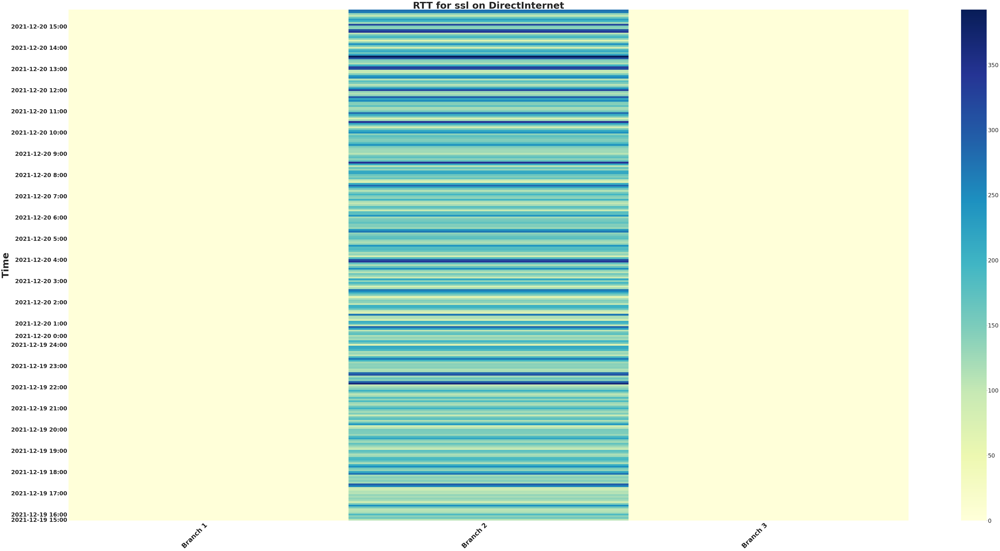

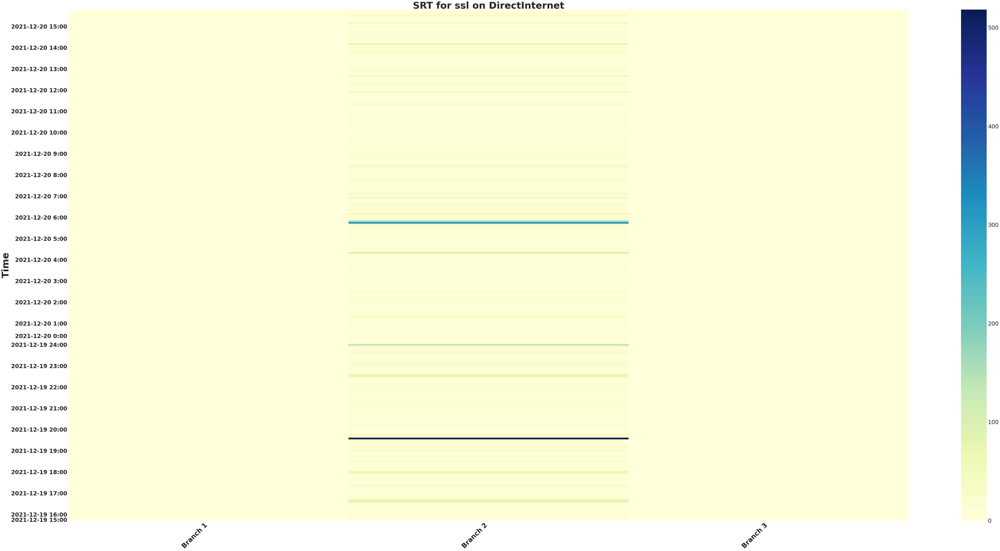

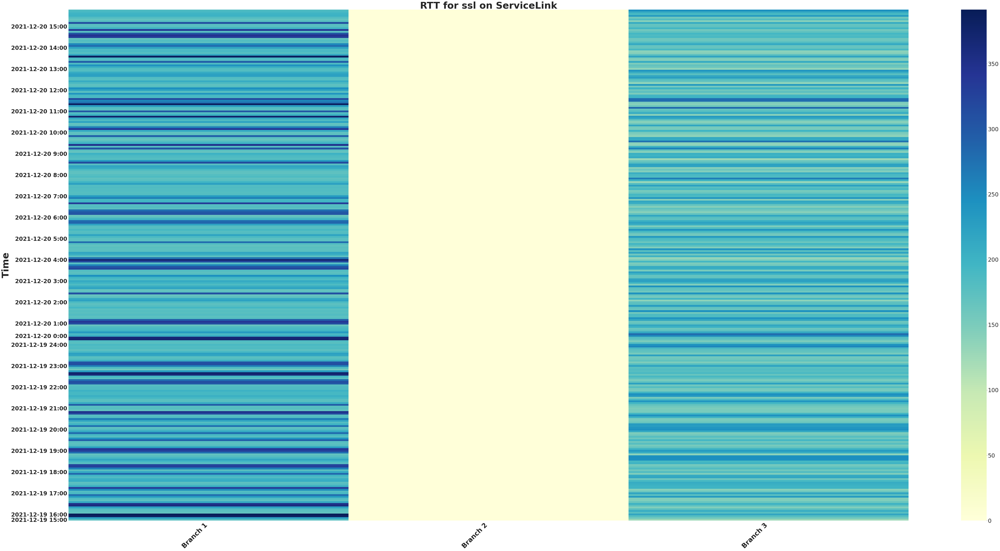

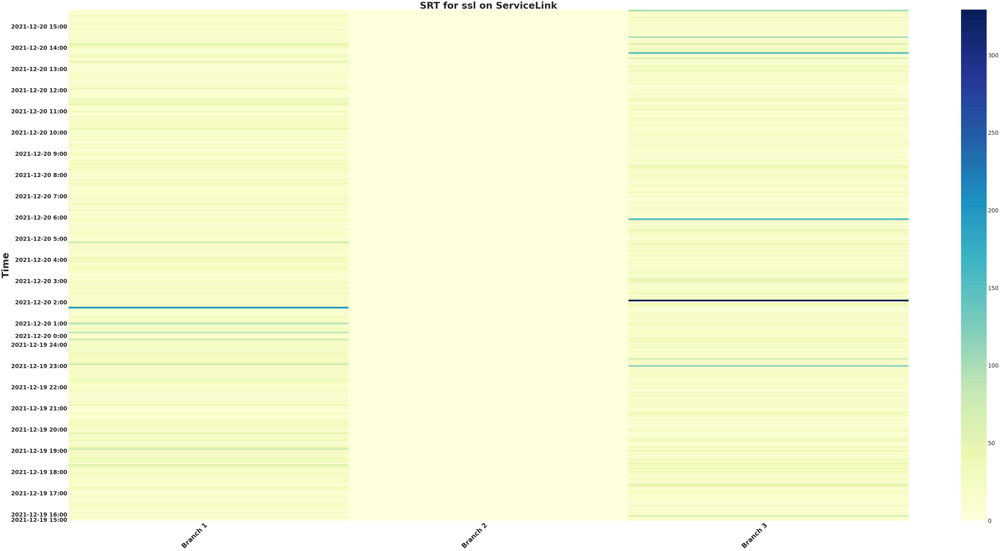

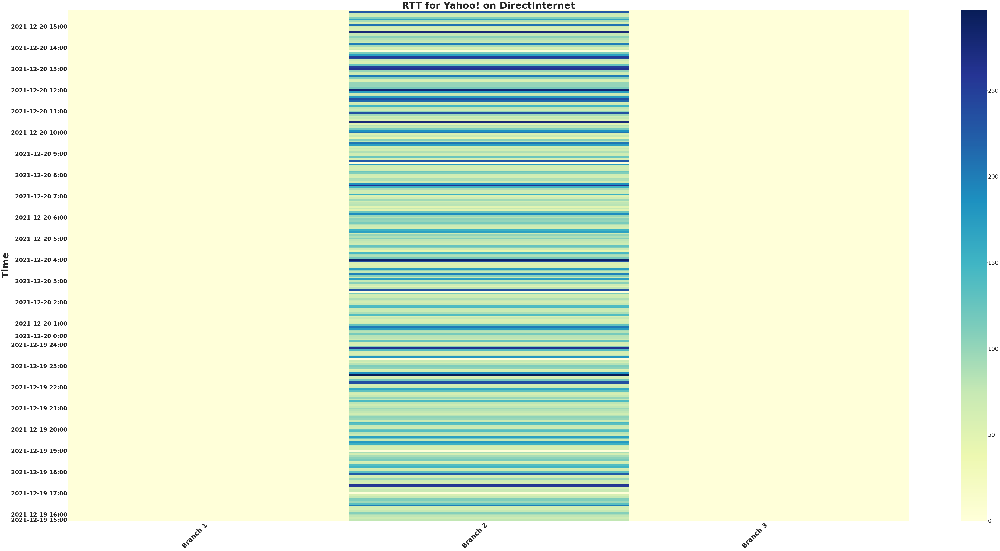

...

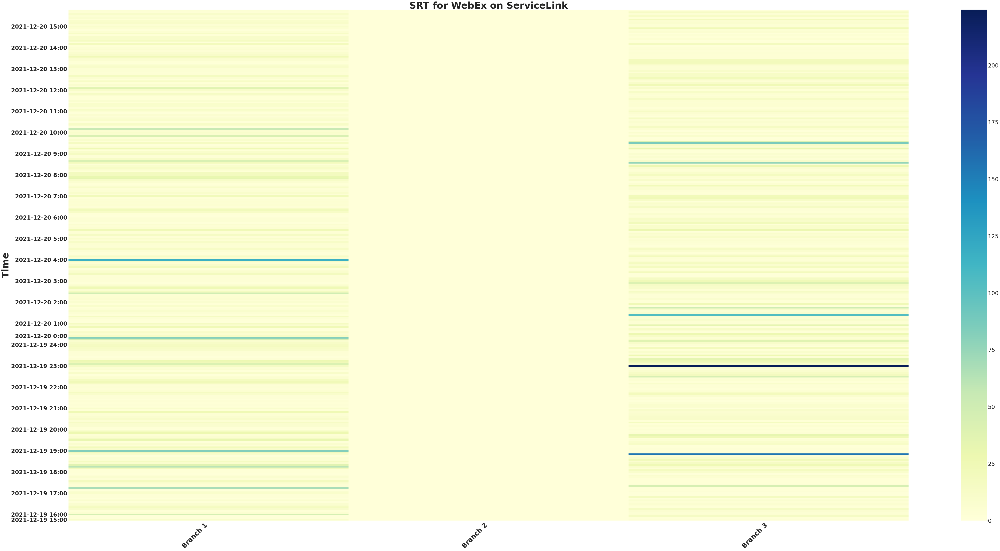

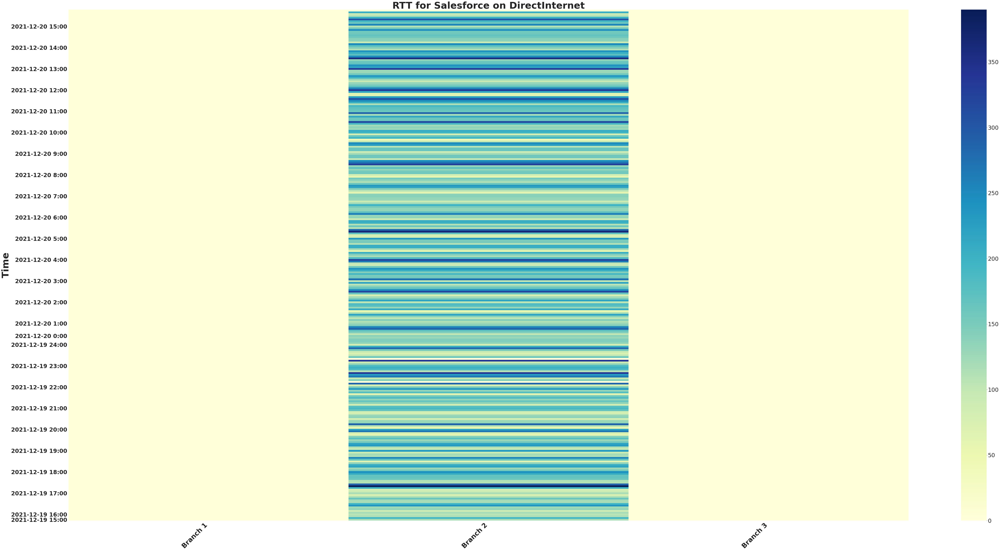

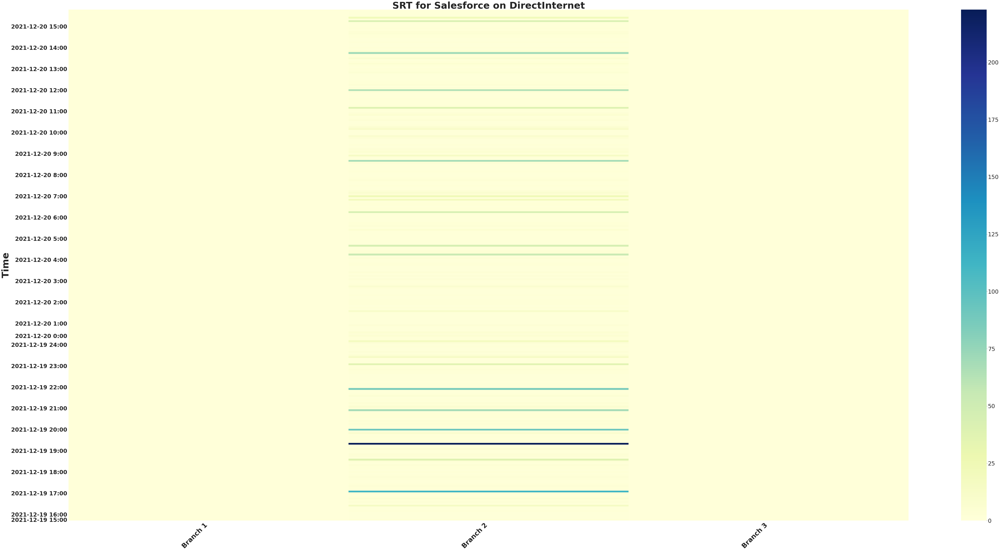

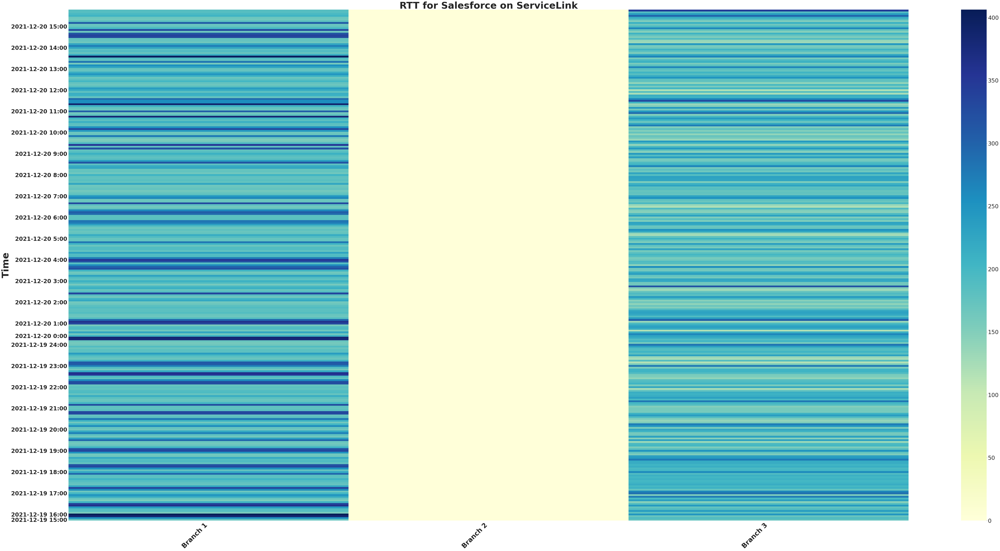

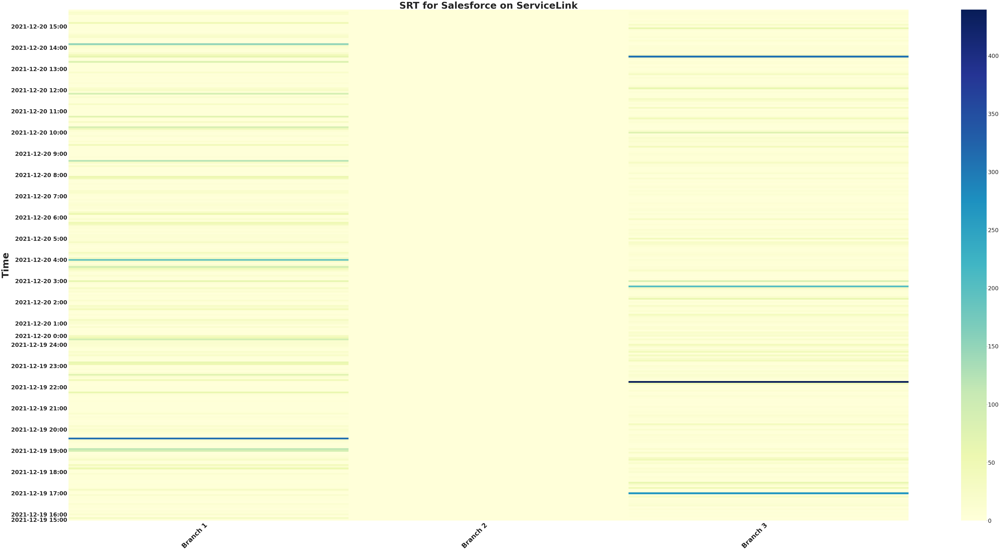

In [24]:
generate_heatmap_appresponse(appresponsetime)

In [25]:
# App Response Distribution Display

getappdistribution(appresponsetime)



In [26]:
generate_table(appdist, dropNAN=True)

,app,dtype,maxval,meanval,path,site,stdval,valpct80
38,ssl,RTT,391.500000,220.088870,ServiceLink,Branch 1,57.856987,277.160000
39,ssl,SRT,201.000000,20.620934,ServiceLink,Branch 1,16.510559,277.160000
40,ssl,RTT,392.500000,166.196943,DirectInternet,Branch 2,61.362840,211.120000
41,ssl,SRT,518.250000,15.006747,DirectInternet,Branch 2,38.185199,211.120000
58,ssl,RTT,283.500000,184.964223,ServiceLink,Branch 3,33.289457,214.925000
59,ssl,SRT,329.300000,21.534658,ServiceLink,Branch 3,24.815454,214.925000
68,Yahoo!,RTT,374.200000,203.474221,ServiceLink,Branch 1,59.072135,257.320000
69,Yahoo!,SRT,288.600000,11.333103,ServiceLink,Branch 1,31.797349,257.320000
70,Yahoo!,RTT,297.000000,106.995626,DirectInternet,Branch 2,57.139851,143.900000
71,Yahoo!,SRT,149.333333,4.256501,DirectInternet,Branch 2,13.767426,143.900000


In [27]:
print("INFO: Based on the values above, these apps below have an RTT performance degradation at the following sites:")
for app in appname_badrttsitelist_dict.keys():
    sites = appname_badrttsitelist_dict[app]
    if len(sites)>0:
        print("App: {}".format(app))
        for site in sites:
            print("\t{}".format(site))
    

INFO: Based on the values above, these apps below have an RTT performance degradation at the following sites:
App: ssl
	Branch 1
	Branch 2
	Branch 3
App: Yahoo!
	Branch 1
	Branch 2
	Branch 3
App: WebPoS
	Branch 1
	Branch 2
	Branch 3
App: Office365 Portal
	Branch 1
	Branch 2
	Branch 3
App: Marketo
	Branch 1
	Branch 2
	Branch 3
App: WebEx
	Branch 1
	Branch 2
	Branch 3
App: Salesforce
	Branch 1
	Branch 2
	Branch 3


In [28]:
print("INFO: Based on the values above, these apps below have an SRT performance degradation at the following sites:")
for app in appname_badsrtsitelist_dict.keys():
    sites = appname_badsrtsitelist_dict[app]
    if len(sites)>0:
        print("App: {}".format(app))
        for site in sites:
            print("\t{}".format(site))

INFO: Based on the values above, these apps below have an SRT performance degradation at the following sites:
App: WebPoS
	Branch 1
	Branch 2
	Branch 3


In [29]:
print("INFO: App Performance Values during possible degredation:")
badappdist

INFO: App Performance Values during possible degredation:


,app,hours,metric,num_dp,num_incidents,path,site,thresh,valpct80
0,ssl,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 2, 3, ...",RTT,289.0,74.0,ServiceLink,Branch 1,240.006897,277.160000
1,ssl,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",RTT,289.0,93.0,DirectInternet,Branch 2,177.585223,211.120000
2,ssl,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",RTT,289.0,111.0,ServiceLink,Branch 3,191.699920,214.925000
3,Yahoo!,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 2, 3, ...",RTT,289.0,75.0,ServiceLink,Branch 1,222.133333,257.320000
4,Yahoo!,"[16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, 3, 4...",RTT,282.0,85.0,DirectInternet,Branch 2,114.663320,143.900000
5,Yahoo!,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",RTT,289.0,116.0,ServiceLink,Branch 3,148.549848,172.542857
6,WebPoS,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",RTT,289.0,89.0,VPN,Branch 1,363.703860,608.960000
7,WebPoS,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",SRT,289.0,221.0,VPN,Branch 1,363.703860,3198.280000
8,WebPoS,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",RTT,289.0,93.0,VPN,Branch 2,378.884035,631.840000
9,WebPoS,"[15, 16, 17, 18, 19, 20, 21, 22, 23, 0, 1, 2, ...",SRT,289.0,212.0,VPN,Branch 2,378.884035,3219.360000


In [30]:
#
# LIST APP TRANSACTION STATS
#

for site in sitename_siteid_dict.keys():
    df = apptransaction[apptransaction.site == site]
    print("\n{}".format(site))
    generate_table(df, tabletype="count")


Branch 1


,app,INIT_SUCCESS,TXN_SUCCESS,INIT_FAIL,TXN_FAIL
0,rtp,0,0,0,0
1,ssl,19757,71653,8081,4407
2,Yahoo!,11289,30981,0,939
3,WebPoS,47474,47468,3,16
4,Office365 Portal,13418,32222,0,52
5,Marketo,8788,16997,1,3048
6,WebEx,8694,21481,0,1493
7,Salesforce,12919,40433,4,76



Branch 2


,app,INIT_SUCCESS,TXN_SUCCESS,INIT_FAIL,TXN_FAIL
0,rtp,0,0,0,0
1,ssl,3668,14023,463,804
2,Yahoo!,2270.0,6857.0,0.0,99.0
3,WebPoS,36780,36775,5,10
4,Office365 Portal,2651.0,6462.0,0.0,8.0
5,Marketo,1733.0,3926.0,0.0,624.0
6,WebEx,1325.0,3944.0,0.0,85.0
7,Salesforce,2550.0,8356.0,0.0,19.0



Branch 3


,app,INIT_SUCCESS,TXN_SUCCESS,INIT_FAIL,TXN_FAIL
0,rtp,0,0,0,0
1,ssl,15603,60294,4830,2788
2,Yahoo!,9208,26714,1,647
3,WebPoS,36800.0,36799.0,2.0,1.0
4,Office365 Portal,10737,27944,0,36
5,Marketo,6748,15040,1,1970
6,WebEx,6329,17033,2,857
7,Salesforce,9870,31779,0,65


In [43]:
# 
# Get Bad Apps based on Transaction values
#
    
#getbadapps_xsact(apptransaction,valfilter = "ALL")
getbadapps_xsact(apptransaction,valfilter = "LIMIT",threshold=10)

In [44]:
#
# Display bad apps
#
for site in sitename_siteid_dict.keys():
    tmp = badapps_xsact[badapps_xsact.site == site]
    if len(tmp) > 0:
        print("\n{}".format(site))
        display.display(tmp)


Branch 1


,app,dtype,pct_fail,site,total_events,val
0,ssl,INIT_FAIL,29.028666,Branch 1,27838.0,8081.0
1,ssl,TXN_FAIL,15.830879,Branch 1,27838.0,4407.0
6,Marketo,TXN_FAIL,34.679713,Branch 1,8789.0,3048.0
9,WebEx,TXN_FAIL,17.172763,Branch 1,8694.0,1493.0



Branch 2


,app,dtype,pct_fail,site,total_events,val
2,ssl,INIT_FAIL,11.207940,Branch 2,4131.0,463.0
3,ssl,TXN_FAIL,19.462600,Branch 2,4131.0,804.0
7,Marketo,TXN_FAIL,36.006924,Branch 2,1733.0,624.0



Branch 3


,app,dtype,pct_fail,site,total_events,val
4,ssl,INIT_FAIL,23.638232,Branch 3,20433.0,4830.0
5,ssl,TXN_FAIL,13.644595,Branch 3,20433.0,2788.0
8,Marketo,TXN_FAIL,29.189510,Branch 3,6749.0,1970.0
10,WebEx,TXN_FAIL,13.536566,Branch 3,6331.0,857.0


In [45]:
#
# Get Unreachable IP Prefix by the hour
#


def get_unreachableprefix_data(appname, site, START_TIME, END_TIME):
    global appunreachable_badapps
    appunreachable_badapps = pd.DataFrame(columns=['app','prefix','app_unreachable_events','failed_connection_events','failed_transaction_events'])

    print("\nRetrieving Unreachable Prefixes for Bad Apps")
            
    data = {
        "end_time":END_TIME,
        "start_time":START_TIME,
        "filter":{
            "site":[sitename_siteid_dict[site]],
            "app":[apps_name_id[appname]],
            "path_type":PATH_TYPE,
        },
        "aggregates":[{"name":"PrefixList"}]
    }

    resp = cgx_session.post.monitor_aggregates(data=data)
    if resp.cgx_status:
        aggregates = resp.cgx_content.get("aggregates", None)[0]
        data = aggregates.get("data")
        prefixlist = data.get("items",None)
        for prefix in prefixlist:
            appunreachable_badapps = appunreachable_badapps.append({"site": site,
                                                    "app":appname,
                                                   "prefix":prefix['prefix'],
                                                    "starttime":START_TIME,
                                                    "endtime":END_TIME,
                                                   "app_unreachable_events":prefix['app_unreachable_events'],
                                                   "failed_connection_events":prefix['failed_connection_events'],
                                                   "failed_transaction_events":prefix['failed_transaction_events']}, ignore_index=True)

#             ds = appunreachable[appunreachable.app == apps_id_name[appid]]
#             if len(ds) > 0:
#                 display.display(ds)

    else:
        print("ERR: Could not query unreachable prefixes for {}".format(apps_id_name[appid]))

    return




In [46]:
applist = badappdist.app.unique()
for app in applist:
    tmp = badappdist[badappdist.app == app]
    sites = tmp.site.unique()
    
    for site in sites:
        df = tmp[tmp.site == site]
        hours = df.hours.values[0]
        if len(hours)>8:
            print("WARN: Anomalous values seen over 8 hours on site {} for app {}".format(site,app))
            print("Check appunreachable dataset for these app,site combination")
            continue
        else:
            starthour = min(hours)
            endhour = max(hours)

            endtime = datetime.datetime.utcnow().replace(second=0, microsecond=0)
            starttime = endtime - datetime.timedelta(hours=24)
            endtimeiso= endtime.isoformat() + "Z"
            starttimeiso = starttime.isoformat() + "Z"
            
            get_unreachableprefix_data(appname=app, site=site,START_TIME=starttimeiso,END_TIME=endtimeiso)


WARN: Anomalous values seen over 8 hours on site Branch 1 for app ssl
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 2 for app ssl
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 3 for app ssl
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 1 for app Yahoo!
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 2 for app Yahoo!
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 3 for app Yahoo!
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 1 for app WebPoS
Check appunreachable dataset for these app,site combination
WARN: Anomalous values seen over 8 hours on site Branch 2 for app WebPoS
Check

In [47]:
# 
# LIST APP UNREACHABLE PREFIXES
# hide app unreachable events
#
for site in sitename_siteid_dict.keys():
    df = appunreachable[appunreachable.site == site]
    if len(df)>0:
        print("{}".format(site))
        generate_table(df)

Branch 1


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
0,ssl,28.0,0.0,0.0,DirectInternet,0.0.0.0/0,Branch 1
1,ssl,26.0,0.0,0.0,VPN,0.0.0.0/0,Branch 1
2,ssl,58.0,7993.0,4355.0,ServiceLink,0.0.0.0/0,Branch 1
3,Yahoo!,639.0,0.0,0.0,ServiceLink,119.161.14.0/27,Branch 1
4,Yahoo!,506.0,0.0,10.0,ServiceLink,212.82.100.150/32,Branch 1
...,...,...,...,...,...,...,...
178,Salesforce,1.0,0.0,0.0,ServiceLink,23.66.115.192/27,Branch 1
179,Salesforce,1.0,0.0,0.0,ServiceLink,136.147.100.251/32,Branch 1
180,Salesforce,1.0,0.0,0.0,ServiceLink,13.109.189.95/32,Branch 1
181,Salesforce,0.0,0.0,1.0,ServiceLink,23.1.99.130/32,Branch 1


Branch 2


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
183,ssl,166.0,461.0,799.0,DirectInternet,0.0.0.0/0,Branch 2
184,ssl,28.0,0.0,0.0,ServiceLink,0.0.0.0/0,Branch 2
185,Yahoo!,1.0,0.0,40.0,DirectInternet,74.6.231.0/27,Branch 2
186,Yahoo!,3.0,0.0,23.0,DirectInternet,98.137.11.160/27,Branch 2
187,Yahoo!,0.0,0.0,19.0,DirectInternet,69.147.88.0/27,Branch 2
...,...,...,...,...,...,...,...
241,Salesforce,0.0,0.0,1.0,DirectInternet,52.40.172.46/32,Branch 2
242,Salesforce,1.0,0.0,0.0,DirectInternet,23.1.35.132/32,Branch 2
243,Salesforce,0.0,0.0,1.0,DirectInternet,52.10.149.115/32,Branch 2
244,Salesforce,6.0,0.0,0.0,VPN,136.147.42.44/32,Branch 2


Branch 3


,app,app_unreachable_events,failed_connection_events,failed_transaction_events,path,prefix,site
246,ssl,28.0,0.0,0.0,DirectInternet,0.0.0.0/0,Branch 3
247,ssl,214.0,4801.0,2773.0,ServiceLink,0.0.0.0/0,Branch 3
248,Yahoo!,1268.0,0.0,0.0,ServiceLink,119.161.8.0/27,Branch 3
249,Yahoo!,1057.0,0.0,0.0,ServiceLink,119.161.14.0/27,Branch 3
250,Yahoo!,1662.0,1.0,23.0,ServiceLink,74.6.136.150/32,Branch 3
...,...,...,...,...,...,...,...
434,Salesforce,1.0,0.0,0.0,ServiceLink,136.147.100.251/32,Branch 3
435,Salesforce,767.0,0.0,0.0,ServiceLink,23.66.115.187/32,Branch 3
436,Salesforce,728.0,0.0,1.0,ServiceLink,184.25.254.121/32,Branch 3
437,Salesforce,1.0,0.0,0.0,ServiceLink,136.147.100.123/32,Branch 3


In [48]:
#
#Results
#

# bad rtt: appname_badrttsitelist_dict badappdist
# bad srt: appname_badsrtsitelist_dict
# bad xsact: badapps_xsact
# bad appunreach: appunreach

print("SUMMARY")
for site in sitename_siteid_dict.keys():
    
    perfsites = list(badappdist.site.unique())
    xsactsites = list(badapps_xsact.site.unique())
    unreachsites = list(appunreachable.site.unique())

    allbadsites = perfsites+xsactsites+unreachsites
    if site in allbadsites:
        print("****** {} ******".format(site))
    else:
        continue

    if site in perfsites:
        tmp = badappdist[badappdist.site == site]
        print("App Performance Issue observed for the following apps:")
        applist = tmp.app.unique()
        
        for app in applist:
            df = tmp[tmp.app == app]
            paths = df.path.unique()
            for path in paths:
                ds = df[df.path == path]
                rtt = ds[ds.metric == "RTT"].metric
                srt = ds[ds.metric == "SRT"].metric
                #print("{} on path {}. RTT: {} SRT: {}".format(app,path,rtt,srt))
                print("\t{} on path {}.".format(app,path))

        
    if site in xsactsites:
        tmp = badapps_xsact[badapps_xsact.site == site]
        print("Transaction Issue observed for the following apps:")
        applist = tmp.app.unique()
        
        for app in applist:
            #df = tmp[tmp.app==app]
            
            print("\t{}".format(app))
            
    if site in unreachsites:
        tmp = appunreachable[appunreachable.site == site]
        print("App Unreachable Issue observed for the following apps:")
        applist = tmp.app.unique()
        
        for app in applist:
            print("\t{}".format(app))
            
            
    print("\n\n")

SUMMARY
****** Branch 1 ******
App Performance Issue observed for the following apps:
	ssl on path ServiceLink.
	Yahoo! on path ServiceLink.
	WebPoS on path VPN.
	Office365 Portal on path ServiceLink.
	Marketo on path ServiceLink.
	WebEx on path ServiceLink.
	Salesforce on path ServiceLink.
Transaction Issue observed for the following apps:
	ssl
	Marketo
	WebEx
App Unreachable Issue observed for the following apps:
	ssl
	Yahoo!
	WebPoS
	Office365 Portal
	Marketo
	WebEx
	Salesforce



****** Branch 2 ******
App Performance Issue observed for the following apps:
	ssl on path DirectInternet.
	Yahoo! on path DirectInternet.
	WebPoS on path VPN.
	Office365 Portal on path DirectInternet.
	Office365 Portal on path ServiceLink.
	Marketo on path DirectInternet.
	WebEx on path DirectInternet.
	Salesforce on path DirectInternet.
Transaction Issue observed for the following apps:
	ssl
	Marketo
App Unreachable Issue observed for the following apps:
	ssl
	Yahoo!
	WebPoS
	Office365 Portal
	Marketo
	W